In [4]:
import pandas as pd
import numpy as np
from os.path import join
import altair as alt # Python wrapper for Vega-Lite visualisation grammarimport altair as alt

In [5]:
DATA_DIR = "../output/"

In [194]:
lint_df2 = pd.read_csv(join(DATA_DIR, "results_pylint_python2.csv"))

In [195]:
lint_df2

,repo,path,type,module,obj,line,column,path.1,symbol,message,message-id,parse_error,internal_error
0,72225778,72225778/predict.py,warning,predict,NaN,16.0,0.0,predict.py,mixed-indentation,Found indentation with tabs instead of spaces,W0312,False,False
1,72225778,72225778/predict.py,warning,predict,NaN,17.0,0.0,predict.py,mixed-indentation,Found indentation with tabs instead of spaces,W0312,False,False
2,72225778,72225778/predict.py,warning,predict,NaN,18.0,0.0,predict.py,mixed-indentation,Found indentation with tabs instead of spaces,W0312,False,False
3,72225778,72225778/predict.py,warning,predict,NaN,20.0,0.0,predict.py,mixed-indentation,Found indentation with tabs instead of spaces,W0312,False,False
4,72225778,72225778/predict.py,warning,predict,NaN,21.0,0.0,predict.py,mixed-indentation,Found indentation with tabs instead of spaces,W0312,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
677063,40576835,40576835/api_benchmarks.py,convention,api_benchmarks,NaN,6.0,0.0,api_benchmarks.py,wrong-import-order,"standard import ""import time"" should be placed...",C0411,False,False
677064,40576835,40576835/settings.py,convention,settings,NaN,5.0,0.0,settings.py,line-too-long,Line too long (107/100),C0301,False,False
677065,40576835,40576835/settings.py,convention,settings,NaN,6.0,0.0,settings.py,line-too-long,Line too long (104/100),C0301,False,False
677066,40576835,40576835/settings.py,convention,settings,NaN,7.0,0.0,settings.py,line-too-long,Line too long (107/100),C0301,False,False


In [196]:
lint_df3 = pd.read_csv(join(DATA_DIR, "results_pylint_python3.csv"))

In [197]:
lint_df3

,repo,path,type,module,obj,line,column,path.1,symbol,message,message-id,parse_error,internal_error
0,72225778,72225778/predict.py,warning,predict,NaN,16.0,0.0,predict.py,mixed-indentation,Found indentation with tabs instead of spaces,W0312,False,False
1,72225778,72225778/predict.py,warning,predict,NaN,17.0,0.0,predict.py,mixed-indentation,Found indentation with tabs instead of spaces,W0312,False,False
2,72225778,72225778/predict.py,warning,predict,NaN,18.0,0.0,predict.py,mixed-indentation,Found indentation with tabs instead of spaces,W0312,False,False
3,72225778,72225778/predict.py,warning,predict,NaN,20.0,0.0,predict.py,mixed-indentation,Found indentation with tabs instead of spaces,W0312,False,False
4,72225778,72225778/predict.py,warning,predict,NaN,21.0,0.0,predict.py,mixed-indentation,Found indentation with tabs instead of spaces,W0312,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
590470,40576835,40576835/api_benchmarks.py,error,api_benchmarks,NaN,90.0,15.0,api_benchmarks.py,syntax-error,Missing parentheses in call to 'print'. Did yo...,E0001,True,False
590471,40576835,40576835/settings.py,convention,settings,NaN,5.0,0.0,settings.py,line-too-long,Line too long (107/100),C0301,False,False
590472,40576835,40576835/settings.py,convention,settings,NaN,6.0,0.0,settings.py,line-too-long,Line too long (104/100),C0301,False,False
590473,40576835,40576835/settings.py,convention,settings,NaN,7.0,0.0,settings.py,line-too-long,Line too long (107/100),C0301,False,False


In [10]:
# https://stackoverflow.com/questions/36004976/count-frequency-of-values-in-pandas-dataframe-column
lint_df = lint_df.groupby(['repo', 'symbol'])['message-id'].describe()

In [11]:
lint_df

count unique    top freq
repo      symbol                                                 
41590     anomalous-backslash-in-string      5      1  W1401    5
          arguments-differ                   2      1  W0221    2
          attribute-defined-outside-init     1      1  W0201    1
          bad-continuation                  63      1  C0330   63
          bad-whitespace                   162      1  C0326  162
...                                        ...    ...    ...  ...
119537109 unused-import                     19      1  W0611   19
          unused-variable                  131      1  W0612  131
          unused-wildcard-import            30      1  W0614   30
          wildcard-import                   11      1  W0401   11
          wrong-import-order                 2      1  C0411    2

[6701 rows x 4 columns]

In [16]:
# https://stackoverflow.com/questions/14507794/pandas-how-to-flatten-a-hierarchical-index-in-columns
lint_df = pd.DataFrame(lint_df.to_records())

In [17]:
lint_df

,repo,symbol,count,unique,top,freq
0,41590,anomalous-backslash-in-string,5,1,W1401,5
1,41590,arguments-differ,2,1,W0221,2
2,41590,attribute-defined-outside-init,1,1,W0201,1
3,41590,bad-continuation,63,1,C0330,63
4,41590,bad-whitespace,162,1,C0326,162
...,...,...,...,...,...,...
6696,119537109,unused-import,19,1,W0611,19
6697,119537109,unused-variable,131,1,W0612,131
6698,119537109,unused-wildcard-import,30,1,W0614,30
6699,119537109,wildcard-import,11,1,W0401,11


In [18]:
lint_df.sort_values(['count'], ascending=False)

,repo,symbol,count,unique,top,freq
6210,104676745,bad-whitespace,135276,1,C0326,135276
1613,13884324,bad-whitespace,77295,1,C0326,77295
765,3546355,bad-continuation,60316,1,C0330,60316
2131,17856536,bad-whitespace,22709,1,C0326,22709
3937,43172794,invalid-name,19042,1,C0103,19042
...,...,...,...,...,...,...
5636,91356408,exec-used,1,1,W0122,1
5635,91356408,deprecated-lambda,1,1,W0110,1
3623,35187829,wildcard-import,1,1,W0401,1
1090,8408538,redefined-outer-name,1,1,W0621,1


In [19]:
lint_df2 = lint_df[['repo', 'symbol']].copy()

In [20]:
lint_df2['cnt'] = lint_df['count'].map(lambda x : int(x)) # workaround bug in Altair with JavaScript integer representation

In [21]:
lint_df2.columns

Index(['repo', 'symbol', 'cnt'], dtype='object')

In [23]:
# https://altair-viz.github.io/user_guide/faq.html#altair-faq-large-notebook
alt.data_transformers.enable('json')

DataTransformerRegistry.enable('json')

In [25]:
lint_df2

,repo,symbol,cnt
0,41590,anomalous-backslash-in-string,5
1,41590,arguments-differ,2
2,41590,attribute-defined-outside-init,1
3,41590,bad-continuation,63
4,41590,bad-whitespace,162
...,...,...,...
6696,119537109,unused-import,19
6697,119537109,unused-variable,131
6698,119537109,unused-wildcard-import,30
6699,119537109,wildcard-import,11


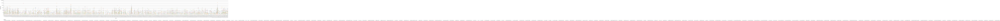

In [26]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(lint_df2).mark_point().encode(
    x = alt.X('repo', type='nominal'),
    y = alt.Y('cnt', scale=alt.Scale(type="log"), title="Issue count"),
    color = alt.Color('symbol', legend=alt.Legend(title="symbol", orient="bottom"))
)
chart

In [27]:
chart.save("symbol-issue-count.png")

In [28]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(lint_df2).mark_point().encode(
    x = alt.X('symbol', type='ordinal'),
    y = alt.Y('cnt', scale=alt.Scale(type="log"), title="Issue count"),
    color = alt.Color('repo', type='nominal', legend=alt.Legend(title="repo", orient="bottom"))
)

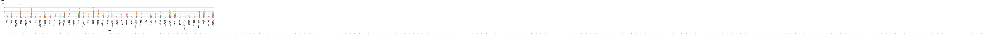

In [29]:
chart

In [30]:
chart.save("count-of-each-pylint-violation-type-for-each-repository.png")

In [31]:
lint_df2

,repo,symbol,cnt
0,41590,anomalous-backslash-in-string,5
1,41590,arguments-differ,2
2,41590,attribute-defined-outside-init,1
3,41590,bad-continuation,63
4,41590,bad-whitespace,162
...,...,...,...
6696,119537109,unused-import,19
6697,119537109,unused-variable,131
6698,119537109,unused-wildcard-import,30
6699,119537109,wildcard-import,11


## Label Repo Type

In [93]:
proj_labels = pd.read_csv("proj_labels.csv")

In [94]:
proj_labels

,repo,path,cat
0,72225778,72225778/predict.py,other
1,72225778,72225778/text_cnn_rnn.py,ml0
2,72225778,72225778/data_helper.py,other
3,72225778,72225778/train.py,other
4,118248283,118248283/train_speech_commands.py,ml0
...,...,...,...
7936,88318858,88318858/batchgen.py,other
7937,88318858,88318858/train.py,other
7938,40576835,40576835/get_accuracies.py,other
7939,40576835,40576835/api_benchmarks.py,other


In [95]:
#https://stackoverflow.com/questions/12860421/python-pandas-pivot-table-with-aggfunc-count-unique-distinct
proj_labels_pivot = pd.pivot_table(proj_labels, values="path", index="repo", columns="cat", aggfunc=pd.Series.nunique)
proj_labels_pivot

cat,ml0,ml1,ml2,ml3,ml4,other,test
repo,,,,,,,
41590,NaN,NaN,NaN,NaN,NaN,22.0,7.0
118130,16.0,NaN,NaN,NaN,NaN,27.0,2.0
550482,NaN,NaN,NaN,NaN,NaN,10.0,3.0
590142,NaN,NaN,NaN,NaN,NaN,610.0,22.0
607040,NaN,NaN,NaN,NaN,NaN,1.0,NaN
...,...,...,...,...,...,...,...
112664267,31.0,2.0,1.0,1.0,NaN,9.0,NaN
114098658,26.0,1.0,2.0,NaN,NaN,13.0,NaN
115672915,47.0,1.0,NaN,NaN,NaN,26.0,NaN


In [96]:
proj_labels_pivot = proj_labels_pivot.fillna(0)

In [97]:
proj_labels_pivot

cat,ml0,ml1,ml2,ml3,ml4,other,test
repo,,,,,,,
41590,0.0,0.0,0.0,0.0,0.0,22.0,7.0
118130,16.0,0.0,0.0,0.0,0.0,27.0,2.0
550482,0.0,0.0,0.0,0.0,0.0,10.0,3.0
590142,0.0,0.0,0.0,0.0,0.0,610.0,22.0
607040,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...
112664267,31.0,2.0,1.0,1.0,0.0,9.0,0.0
114098658,26.0,1.0,2.0,0.0,0.0,13.0,0.0
115672915,47.0,1.0,0.0,0.0,0.0,26.0,0.0


In [98]:
proj_labels_pivot["total"] = proj_labels_pivot.apply("sum", axis=1)

In [99]:
proj_labels_pivot

cat,ml0,ml1,ml2,ml3,ml4,other,test,total
repo,,,,,,,,
41590,0.0,0.0,0.0,0.0,0.0,22.0,7.0,29.0
118130,16.0,0.0,0.0,0.0,0.0,27.0,2.0,45.0
550482,0.0,0.0,0.0,0.0,0.0,10.0,3.0,13.0
590142,0.0,0.0,0.0,0.0,0.0,610.0,22.0,632.0
607040,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...
112664267,31.0,2.0,1.0,1.0,0.0,9.0,0.0,44.0
114098658,26.0,1.0,2.0,0.0,0.0,13.0,0.0,42.0
115672915,47.0,1.0,0.0,0.0,0.0,26.0,0.0,74.0


In [100]:
proj_labels_pivot["frac_ml"] = proj_labels_pivot["ml0"] / proj_labels_pivot["total"]

In [101]:
proj_labels_pivot

cat,ml0,ml1,ml2,ml3,ml4,other,test,total,frac_ml
repo,,,,,,,,,
41590,0.0,0.0,0.0,0.0,0.0,22.0,7.0,29.0,0.000000
118130,16.0,0.0,0.0,0.0,0.0,27.0,2.0,45.0,0.355556
550482,0.0,0.0,0.0,0.0,0.0,10.0,3.0,13.0,0.000000
590142,0.0,0.0,0.0,0.0,0.0,610.0,22.0,632.0,0.000000
607040,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.000000
...,...,...,...,...,...,...,...,...,...
112664267,31.0,2.0,1.0,1.0,0.0,9.0,0.0,44.0,0.704545
114098658,26.0,1.0,2.0,0.0,0.0,13.0,0.0,42.0,0.619048
115672915,47.0,1.0,0.0,0.0,0.0,26.0,0.0,74.0,0.635135


In [88]:
#pd.set_option("display.max_rows", 1000)

In [89]:
proj_labels_pivot.sort_values("frac_ml", ascending=False)

cat,ml0,ml1,ml2,ml3,ml4,other,test,total,frac_ml
repo,,,,,,,,,
53430164,4.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.0
69533102,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
21574434,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
67244718,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
109562178,3.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0
...,...,...,...,...,...,...,...,...,...
17856536,0.0,0.0,0.0,0.0,0.0,498.0,24.0,522.0,0.0
18617947,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
18633922,0.0,0.0,0.0,0.0,0.0,3.0,0.0,3.0,0.0


In [90]:
#pd.reset_option("display.max_rows")

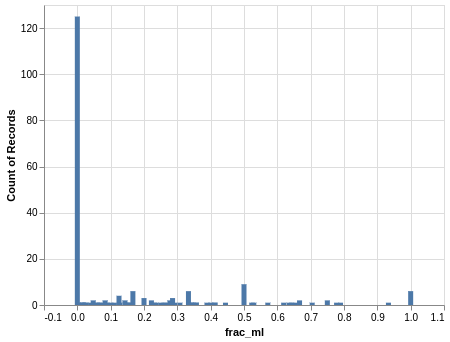

In [110]:
chart = alt.Chart(proj_labels_pivot).mark_bar().encode(
    x = alt.X('frac_ml', type='quantitative', title="frac_ml", scale=alt.Scale(domain=(0,1))),
    y = alt.Y('count()'),
)
chart

Declare any repos with more than 10% ML code as ML.

This threshold helps ensure that the project is genuinely ML code, rather than just a large repo that happens to contain a few ML examples.

In [116]:
proj_labels_pivot["is_ml_repo"] = proj_labels_pivot["frac_ml"] >= 0.1

In [117]:
proj_labels_pivot

cat,ml0,ml1,ml2,ml3,ml4,other,test,total,frac_ml,is_ml_repo
repo,,,,,,,,,,
41590,0.0,0.0,0.0,0.0,0.0,22.0,7.0,29.0,0.000000,False
118130,16.0,0.0,0.0,0.0,0.0,27.0,2.0,45.0,0.355556,True
550482,0.0,0.0,0.0,0.0,0.0,10.0,3.0,13.0,0.000000,False
590142,0.0,0.0,0.0,0.0,0.0,610.0,22.0,632.0,0.000000,False
607040,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.000000,False
...,...,...,...,...,...,...,...,...,...,...
112664267,31.0,2.0,1.0,1.0,0.0,9.0,0.0,44.0,0.704545,True
114098658,26.0,1.0,2.0,0.0,0.0,13.0,0.0,42.0,0.619048,True
115672915,47.0,1.0,0.0,0.0,0.0,26.0,0.0,74.0,0.635135,True


In [129]:
import_sets_df_simp = pd.DataFrame({"repo": proj_labels_pivot.index, "isML": proj_labels_pivot["is_ml_repo"].values})

In [130]:
import_sets_df_simp

,repo,isML
0,41590,False
1,118130,True
2,550482,False
3,590142,False
4,607040,False
...,...,...
217,112664267,True
218,114098658,True
219,115672915,True
220,118248283,True


In [131]:
import_sets_df_simp["isML"].describe()

count       222
unique        2
top       False
freq        141
Name: isML, dtype: object

In [133]:
lint_df2merged = lint_df2.merge(import_sets_df_simp, left_on='repo', right_on='repo')

In [134]:
lint_df2merged

,repo,symbol,cnt,isML
0,41590,anomalous-backslash-in-string,5,False
1,41590,arguments-differ,2,False
2,41590,attribute-defined-outside-init,1,False
3,41590,bad-continuation,63,False
4,41590,bad-whitespace,162,False
...,...,...,...,...
6696,119537109,unused-import,19,True
6697,119537109,unused-variable,131,True
6698,119537109,unused-wildcard-import,30,True
6699,119537109,wildcard-import,11,True


In [135]:
# Will fail, because currently only analysing Py3
# If fails, means not all repos were in import sets.
assert len(lint_df2merged) == len(import_sets_df_simp)

AssertionError: 

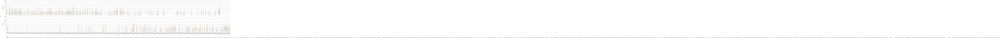

In [144]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(lint_df2merged).mark_point().encode(
    x = alt.X('repo', type='nominal'),
    y = alt.Y('cnt', scale=alt.Scale(type="log"), title="Issue count"),
    color = alt.Color('symbol', legend=alt.Legend(title="symbol", orient="bottom")),
    row = 'isML'
)
chart

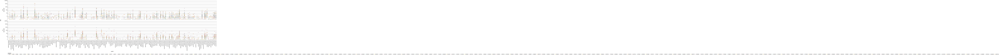

In [147]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(lint_df2merged).mark_point().encode(
    x = alt.X('symbol', type='ordinal'),
    y = alt.Y('cnt', scale=alt.Scale(type="log"), title="Issue count"),
    color = alt.Color('repo', type='nominal', legend=alt.Legend(title="repository", orient="bottom")),
    row = 'isML'
)
chart

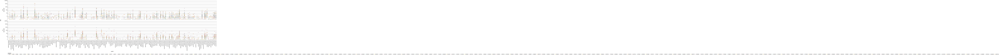

In [148]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(lint_df2merged).mark_point().encode(
    x = alt.X('symbol', type='ordinal'),
    y = alt.Y('cnt', scale=alt.Scale(type="log"), title="Issue count"),
    color = alt.Color('repo', type='nominal', legend=alt.Legend(title="repository", orient="bottom")),
    row = 'isML'
)
chart

In [149]:
# todo: Run MANOVA as (frequentist) test of statistical significance 

In [150]:
# https://www.statsmodels.org/stable/examples/notebooks/generated/interactions_anova.html (see treatment example at end of page)

In [151]:
from statsmodels.formula.api import ols
from statsmodels.graphics.api import interaction_plot, abline_plot
from statsmodels.stats.anova import anova_lm

In [152]:
lint_df2merged

,repo,symbol,cnt,isML
0,41590,anomalous-backslash-in-string,5,False
1,41590,arguments-differ,2,False
2,41590,attribute-defined-outside-init,1,False
3,41590,bad-continuation,63,False
4,41590,bad-whitespace,162,False
...,...,...,...,...
6696,119537109,unused-import,19,True
6697,119537109,unused-variable,131,True
6698,119537109,unused-wildcard-import,30,True
6699,119537109,wildcard-import,11,True


In [153]:
# http://md.psych.bio.uni-goettingen.de/mv/unit/lm_cat/lm_cat_unbal_ss_explained.html
# Type 1:
#    SS(A) for factor A. 
#    SS(B | A) for factor B. 
#    SS(AB | B, A) for interaction AB. 
#
# Because of the sequential nature and the fact that the two main factors are tested in a particular order,
# this type of sums of squares will give different results for unbalanced data depending on which main effect is considered first.
#
# For unbalanced data, this approach tests for a difference in the weighted marginal means.
# In practical terms, this means that the results are dependent on the realized sample sizes, namely the proportions in the particular data set.
# In other words, it is testing the first factor without controlling for the other factor (for further discussion and a worked example, see Zahn [4]). 

# We test for symbol first (as this is expected to have the greatest effect), then look at isML|symbol and interactions
# Data set is (reasonably) ballanced (same number of observations in each group), so tests should be equivalent (but aren't)
# (Problem: need to include 0s for errors that don't occur)

# https://www.statsmodels.org/stable/examples/notebooks/generated/interactions_anova.html
nosum_lm = ols('np.log(cnt+1) ~ C(symbol, Sum) * C(isML, Sum)',
            data=lint_df2merged).fit()

In [154]:
nosum_lm

In [155]:
print(anova_lm(nosum_lm)) # Most meaningful

                                 df        sum_sq    mean_sq          F  \
C(symbol, Sum)                165.0   4398.978147  26.660474  16.812907   
C(isML, Sum)                    1.0      2.690594   2.690594   1.696770   
C(symbol, Sum):C(isML, Sum)   165.0    301.877859   1.829563   1.153778   
Residual                     6394.0  10139.059913   1.585715        NaN   

                               PR(>F)  
C(symbol, Sum)               0.000000  
C(isML, Sum)                 0.192758  
C(symbol, Sum):C(isML, Sum)  0.088950  
Residual                          NaN  


In [156]:
print(anova_lm(nosum_lm, typ=2))

                                   sum_sq      df           F    PR(>F)
C(symbol, Sum)               40572.764643   165.0  155.069219  0.000000
C(isML, Sum)                     2.431641     1.0    1.533467  0.215638
C(symbol, Sum):C(isML, Sum)    288.254831   165.0    1.101711  0.179532
Residual                     10139.059913  6394.0         NaN       NaN


/home/andrew/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 165, but rank is 142
  'rank is %d' % (J, J_), ValueWarning)


In [157]:
print(anova_lm(nosum_lm, typ=3))

                                   sum_sq      df            F    PR(>F)
Intercept                     3054.214531     1.0  1926.080710  0.000000
C(symbol, Sum)                4249.859619   165.0    16.242975  0.000000
C(isML, Sum)                     0.594475     1.0     0.374894  0.540370
C(symbol, Sum):C(isML, Sum)    288.254831   165.0     1.101711  0.179532
Residual                     10139.059913  6394.0          NaN       NaN


Conclusion: difference between symbols is (unsurprisingly) significant. Effect of isML is significant at 0.006 (type 1), 0.02 (type 2) or 0.2 (type 3).

Should we have run a MANOVA instead?
https://www.statisticssolutions.com/directory-of-statistical-analyses-manova-analysis/
https://www.researchgate.net/post/What_is_the_difference_between_ANOVA_MANOVA
(Yes -- MANOVA would be prefereable)


In [158]:
# See https://www.marsja.se/python-manova-made-easy-using-statsmodels/ for tutorial on MANOVA in Python

In [159]:
import math

In [160]:
lint_df2merged_log = lint_df2merged.copy()
lint_df2merged_log["cnt"] = np.log(lint_df2merged_log["cnt"] + 1) # log transform

In [161]:
lint_df2mergedpivot = lint_df2merged_log[["repo", "isML", "symbol", "cnt"]].pivot_table(index=["repo", "isML"], columns="symbol")
lint_df2mergedpivot

cnt                  \
symbol          abstract-class-instantiated abstract-method   
repo      isML                                                
41590     False                         NaN             NaN   
118130    True                          NaN             NaN   
550482    False                         NaN             NaN   
590142    False                         NaN        0.693147   
607040    False                         NaN             NaN   
...                                     ...             ...   
112664267 True                          NaN             NaN   
114098658 True                          NaN             NaN   
115672915 True                          NaN             NaN   
118248283 True                          NaN             NaN   
119537109 True                          NaN             NaN   

                                                                               \
symbol          access-member-before-definition anomalous-backslash-in-string   
repo      isML                                                                  
41590     False                             NaN                      1.791759   
118130    True                              NaN                      1.386294   
550482    False                             NaN                      3.688879   
590142    False                        2.484907                      4.356709   
607040    False                             NaN                      1.386294   
...                                         ...                           ...   
112664267 True                              NaN                      2.564949   
114098658 True                              NaN                      2.397895   
115672915 True                              NaN                      0.693147   
118248283 True                              NaN                      1.098612   
119537109 True                              NaN                           NaN   

                                                                     \
symbol          anomalous-unicode-escape-in-string arguments-differ   
repo      isML                                                        
41590     False                                NaN         1.098612   
118130    True                                 NaN         0.693147   
550482    False                                NaN              NaN   
590142    False                           0.693147         3.465736   
607040    False                                NaN              NaN   
...                                            ...              ...   
112664267 True                                 NaN         0.693147   
114098658 True                                 NaN         2.564949   
115672915 True                                 NaN         2.890372   
118248283 True                                 NaN              NaN   
119537109 True                                 NaN         2.397895   

                                                          \
symbol          assign-to-new-keyword assigning-non-slot   
repo      isML                                             
41590     False                   NaN                NaN   
118130    True                    NaN                NaN   
550482    False                   NaN                NaN   
590142    False                   NaN                NaN   
607040    False                   NaN                NaN   
...                               ...                ...   
112664267 True                    NaN                NaN   
114098658 True                    NaN                NaN   
115672915 True                    NaN                NaN   
118248283 True                    NaN                NaN   
119537109 True                    NaN                NaN   

                                                                ...  \
symbol          assignment-from-no-return assignment-from-none  ...   
repo      isML                              

In [162]:
lint_df2mergedpivot_clean = lint_df2mergedpivot.fillna(value = 0)
lint_df2mergedpivot_clean

cnt                  \
symbol          abstract-class-instantiated abstract-method   
repo      isML                                                
41590     False                         0.0        0.000000   
118130    True                          0.0        0.000000   
550482    False                         0.0        0.000000   
590142    False                         0.0        0.693147   
607040    False                         0.0        0.000000   
...                                     ...             ...   
112664267 True                          0.0        0.000000   
114098658 True                          0.0        0.000000   
115672915 True                          0.0        0.000000   
118248283 True                          0.0        0.000000   
119537109 True                          0.0        0.000000   

                                                                               \
symbol          access-member-before-definition anomalous-backslash-in-string   
repo      isML                                                                  
41590     False                        0.000000                      1.791759   
118130    True                         0.000000                      1.386294   
550482    False                        0.000000                      3.688879   
590142    False                        2.484907                      4.356709   
607040    False                        0.000000                      1.386294   
...                                         ...                           ...   
112664267 True                         0.000000                      2.564949   
114098658 True                         0.000000                      2.397895   
115672915 True                         0.000000                      0.693147   
118248283 True                         0.000000                      1.098612   
119537109 True                         0.000000                      0.000000   

                                                                     \
symbol          anomalous-unicode-escape-in-string arguments-differ   
repo      isML                                                        
41590     False                           0.000000         1.098612   
118130    True                            0.000000         0.693147   
550482    False                           0.000000         0.000000   
590142    False                           0.693147         3.465736   
607040    False                           0.000000         0.000000   
...                                            ...              ...   
112664267 True                            0.000000         0.693147   
114098658 True                            0.000000         2.564949   
115672915 True                            0.000000         2.890372   
118248283 True                            0.000000         0.000000   
119537109 True                            0.000000         2.397895   

                                                          \
symbol          assign-to-new-keyword assigning-non-slot   
repo      isML                                             
41590     False                   0.0                0.0   
118130    True                    0.0                0.0   
550482    False                   0.0                0.0   
590142    False                   0.0                0.0   
607040    False                   0.0                0.0   
...                               ...                ...   
112664267 True                    0.0                0.0   
114098658 True                    0.0                0.0   
115672915 True                    0.0                0.0   
118248283 True                    0.0                0.0   
119537109 True                    0.0                0.0   

                                                                ...  \
symbol          assignment-from-no-return assignment-from-none  ...   
repo      isML                              

In [163]:
# Adapted from https://stackoverflow.com/questions/14507794/pandas-how-to-flatten-a-hierarchical-index-in-columns
lint_df2mergedpivot_clean.columns = [symbolLev.replace('-', '_') for cntLev, symbolLev in lint_df2mergedpivot_clean.columns.values]

In [164]:
# Adapted from https://stackoverflow.com/questions/14507794/pandas-how-to-flatten-a-hierarchical-index-in-columns
lint_df2mergedpivot_clean = pd.DataFrame(lint_df2mergedpivot_clean.to_records())

In [165]:
lint_df2mergedpivot_clean

,repo,isML,abstract_class_instantiated,abstract_method,access_member_before_definition,anomalous_backslash_in_string,anomalous_unicode_escape_in_string,arguments_differ,assign_to_new_keyword,assigning_non_slot,...,unused_import,unused_variable,unused_wildcard_import,used_before_assignment,useless_else_on_loop,useless_super_delegation,using_constant_test,wildcard_import,wrong_import_order,wrong_import_position
0,41590,False,0.0,0.000000,0.000000,1.791759,0.000000,1.098612,0.0,0.0,...,2.302585,3.218876,0.000000,0.000000,0.000000,0.693147,0.000000,0.000000,1.386294,0.000000
1,118130,True,0.0,0.000000,0.000000,1.386294,0.000000,0.693147,0.0,0.0,...,2.708050,3.970292,0.000000,2.197225,0.000000,0.000000,0.000000,0.000000,2.772589,2.890372
2,550482,False,0.0,0.000000,0.000000,3.688879,0.000000,0.000000,0.0,0.0,...,0.693147,1.098612,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.197225,0.000000
3,590142,False,0.0,0.693147,2.484907,4.356709,0.693147,3.465736,0.0,0.0,...,5.017280,5.278115,4.905275,1.098612,0.000000,1.609438,0.693147,4.007333,4.779123,4.158883
4,607040,False,0.0,0.000000,0.000000,1.386294,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.386294,1.609438
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217,112664267,True,0.0,0.000000,0.000000,2.564949,0.000000,0.693147,0.0,0.0,...,4.007333,4.290459,2.197225,1.098612,0.693147,1.098612,0.000000,2.197225,2.890372,3.135494
218,114098658,True,0.0,0.000000,0.000000,2.397895,0.000000,2.564949,0.0,0.0,...,3.850148,2.079442,0.000000,0.000000,0.000000,0.000000,0.693147,0.000000,3.737670,2.639057
219,115672915,True,0.0,0.000000,0.000000,0.693147,0.000000,2.890372,0.0,0.0,...,2.944439,3.295837,1.386294,0.000000,0.000000,0.693147,0.000000,0.693147,2.944439,0.000000
220,118248283,True,0.0,0.000000,0.000000,1.098612,0.000000,0.000000,0.0,0.0,...,1.791759,2.079442,3.496508,0.000000,0.000000,0.000000,0.000000,3.178054,1.386294,0.000000


In [166]:
lint_df2mergedpivot_clean.index

RangeIndex(start=0, stop=222, step=1)

In [167]:
list(lint_df2mergedpivot_clean.columns)[:2]

['repo', 'isML']

In [170]:
list(lint_df2mergedpivot_clean.columns)[2:]

['abstract_class_instantiated',
 'abstract_method',
 'access_member_before_definition',
 'anomalous_backslash_in_string',
 'anomalous_unicode_escape_in_string',
 'arguments_differ',
 'assign_to_new_keyword',
 'assigning_non_slot',
 'assignment_from_no_return',
 'assignment_from_none',
 'attribute_defined_outside_init',
 'bad_classmethod_argument',
 'bad_continuation',
 'bad_except_order',
 'bad_format_character',
 'bad_indentation',
 'bad_mcs_classmethod_argument',
 'bad_mcs_method_argument',
 'bad_option_value',
 'bad_staticmethod_argument',
 'bad_super_call',
 'bad_whitespace',
 'bare_except',
 'blacklisted_name',
 'broad_except',
 'catching_non_exception',
 'cell_var_from_loop',
 'consider_iterating_dictionary',
 'consider_merging_isinstance',
 'consider_using_enumerate',
 'consider_using_ternary',
 'dangerous_default_value',
 'deprecated_lambda',
 'deprecated_method',
 'duplicate_key',
 'empty_docstring',
 'eval_used',
 'exec_used',
 'expression_not_assigned',
 'fatal',
 'fixme',
 

In [171]:
# https://github.com/marsja/jupyter/blob/master/MANOVA_Test_in_Python_Statsmodels_Example.ipynb
formula = ' + '.join(list(lint_df2mergedpivot_clean.columns)[2:]) + ' ~ isML'
formula

'abstract_class_instantiated + abstract_method + access_member_before_definition + anomalous_backslash_in_string + anomalous_unicode_escape_in_string + arguments_differ + assign_to_new_keyword + assigning_non_slot + assignment_from_no_return + assignment_from_none + attribute_defined_outside_init + bad_classmethod_argument + bad_continuation + bad_except_order + bad_format_character + bad_indentation + bad_mcs_classmethod_argument + bad_mcs_method_argument + bad_option_value + bad_staticmethod_argument + bad_super_call + bad_whitespace + bare_except + blacklisted_name + broad_except + catching_non_exception + cell_var_from_loop + consider_iterating_dictionary + consider_merging_isinstance + consider_using_enumerate + consider_using_ternary + dangerous_default_value + deprecated_lambda + deprecated_method + duplicate_key + empty_docstring + eval_used + exec_used + expression_not_assigned + fatal + fixme + format_combined_specification + function_redefined + global_at_module_level + glob

In [172]:
from statsmodels.multivariate.manova import MANOVA

In [173]:
# TODO: Check if '-' symbols is okay. (No. Replaced by '_' to fix this)
# https://github.com/marsja/jupyter/blob/master/MANOVA_Test_in_Python_Statsmodels_Example.ipynb
# TODO: Use log scale

maov = MANOVA.from_formula(formula, data=lint_df2mergedpivot_clean)


In [174]:
print(maov.mv_test())


                        Multivariate linear model
                                                                         
-------------------------------------------------------------------------
       Intercept              Value        Num DF   Den DF F Value Pr > F
-------------------------------------------------------------------------
          Wilks' lambda -15370465629.6161 156.0000 65.0000 -0.4167 1.0000
         Pillai's trace   5457718173.0274 156.0000 65.0000 -0.4167 1.0000
 Hotelling-Lawley trace           -2.6034 156.0000 65.0000 -1.0848 1.0000
    Roy's greatest root            1.8757 156.0000 65.0000  0.7815 0.8898
-------------------------------------------------------------------------
                                                                         
--------------------------------------------------------------------------
            isML              Value      Num DF    Den DF  F Value  Pr > F
------------------------------------------------------------

Above values make no sense (e.g. negative F value). Seems that the large number of dimensions lead to numerical errors.

In [179]:
maov = MANOVA.from_formula('arguments_differ + bad_whitespace ~ isML', data=lint_df2mergedpivot_clean) # simple test
print(maov.mv_test())

                  Multivariate linear model
                                                             
-------------------------------------------------------------
       Intercept        Value  Num DF  Den DF  F Value Pr > F
-------------------------------------------------------------
          Wilks' lambda 0.5350 2.0000 219.0000 95.1620 0.0000
         Pillai's trace 0.4650 2.0000 219.0000 95.1620 0.0000
 Hotelling-Lawley trace 0.8691 2.0000 219.0000 95.1620 0.0000
    Roy's greatest root 0.8691 2.0000 219.0000 95.1620 0.0000
-------------------------------------------------------------
                                                             
-------------------------------------------------------------
          isML          Value  Num DF  Den DF  F Value Pr > F
-------------------------------------------------------------
          Wilks' lambda 0.9919 2.0000 219.0000  0.8919 0.4113
         Pillai's trace 0.0081 2.0000 219.0000  0.8919 0.4113
 Hotelling-Lawley trace 0.

https://www.statisticssolutions.com/anovas-and-manovas/
https://www.statisticssolutions.com/checking-the-additional-assumptions-of-a-manova/
May be best to just run multiple t-tests and then apply Bonferroni correction (as am having problems with numerical overflows)

In [181]:
factors = list(lint_df2mergedpivot_clean.columns)[2:]

In [182]:
import scipy.stats as stats

In [183]:
def one_way_test(a, b):
    meana = np.mean(a)
    meda = np.median(a)
    stda = np.std(a, ddof=1) # sample SD
    meanb = np.mean(b)
    medb = np.median(b)
    stdb = np.std(b, ddof=1) # sample SD
    # f-test (one-way ANOVA)
    f_stat, f_pval = stats.f_oneway(a, b)
    # kruskal (non-parametric equivalent to the ANOVA testing difference of median)
    k_stat, k_pval = stats.kruskal(a, b)
    # mannwhitneyu (rank test on independent samples)
    # Disclaimer: "Use only when the number of observation in each sample is > 20"
    u_stat, u_pval = stats.mannwhitneyu(a, b)
    # TODO: consider Fisher's exact test on errors-vs-non-errors
    
    return [meana, meda, stda, meanb, medb, stdb, f_stat, f_pval, k_stat, k_pval, u_stat, u_pval]

In [184]:
rows = []
for factor in factors:
    a = lint_df2mergedpivot_clean[lint_df2mergedpivot_clean["isML"] == True]
    b = lint_df2mergedpivot_clean[lint_df2mergedpivot_clean["isML"] == False]
    row = [factor] + one_way_test(a[factor], b[factor])
    rows.append(row)

In [185]:
df = pd.DataFrame.from_records(rows, columns=["factor", "meana", "meda", "stda", "meanb", "medb", "stdb", "f_stat", "f_pval", "k_stat", "k_pval", "u_stat", "u_pval"])

In [186]:
# Example comparison of factors:
lint_df2mergedpivot_clean[lint_df2mergedpivot_clean["isML"] == True]["abstract_class_instantiated"]

1      0.0
20     0.0
53     0.0
71     0.0
74     0.0
      ... 
217    0.0
218    0.0
219    0.0
220    0.0
221    0.0
Name: abstract_class_instantiated, Length: 81, dtype: float64

In [187]:
lint_df2mergedpivot_clean[lint_df2mergedpivot_clean["isML"] == False]["abstract_class_instantiated"]

0      0.00000
2      0.00000
3      0.00000
4      0.00000
5      0.00000
        ...   
202    0.00000
206    0.00000
207    0.00000
210    0.00000
211    1.94591
Name: abstract_class_instantiated, Length: 141, dtype: float64

In [188]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

In [189]:
df.sort_values("k_pval")

,factor,meana,meda,stda,meanb,medb,stdb,f_stat,f_pval,k_stat,k_pval,u_stat,u_pval
47,import_error,3.367657,3.135494,1.037843,2.135653,1.945910,1.427000,46.272758,9.592612e-11,45.654851,1.410364e-11,2600.0,7.104853e-12
130,too_many_locals,1.560722,1.386294,1.103577,0.880684,0.693147,1.150965,18.502051,2.552468e-05,25.215387,5.127150e-07,3455.5,2.578480e-07
123,too_many_arguments,1.428822,1.386294,1.181863,0.771643,0.000000,1.210831,15.419966,1.151852e-04,23.892314,1.018777e-06,3573.0,5.123544e-07
143,ungrouped_imports,0.809191,0.693147,0.893152,0.440891,0.000000,0.853618,9.257914,2.629963e-03,18.207034,1.981456e-05,3953.0,9.961311e-06
118,superfluous_parens,2.120342,2.079442,1.516964,1.297709,0.693147,1.453274,15.964211,8.806339e-05,16.034955,6.218376e-05,3904.0,3.123796e-05
132,too_many_public_methods,0.039739,0.000000,0.357653,0.256956,0.000000,0.643269,7.834348,5.581587e-03,14.468324,1.425364e-04,4700.0,7.181190e-05
59,line_too_long,3.066000,3.367296,1.703218,2.336759,1.945910,1.951686,7.864260,5.493180e-03,10.721186,1.059158e-03,4205.5,5.316213e-04
29,consider_using_enumerate,0.561651,0.693147,0.727717,0.364659,0.000000,0.786720,3.404323,6.636986e-02,10.099393,1.483182e-03,4475.0,7.448872e-04
128,too_many_instance_attributes,0.915844,0.693147,0.908875,0.606270,0.000000,0.909559,5.962864,1.539966e-02,9.537927,2.012689e-03,4377.0,1.010273e-03
116,super_init_not_called,0.148906,0.000000,0.643894,0.420192,0.000000,0.866902,6.019403,1.492689e-02,9.533749,2.017277e-03,4703.5,1.013854e-03


In [190]:
pd.reset_option("display.max_rows")
pd.reset_option("display.max_columns")

In [191]:
# Analysis of Cyclomatic complexity

In [193]:
cyc_df = pd.read_csv("radon_cyclomatic_structured.csv",
                     usecols=["repository","path","type","rank","endline","complexity","name","col_offset","lineno","classname","error"],
                     low_memory=False
)
cyc_df

FileNotFoundError: [Errno 2] File b'radon_cyclomatic_structured.csv' does not exist: b'radon_cyclomatic_structured.csv'

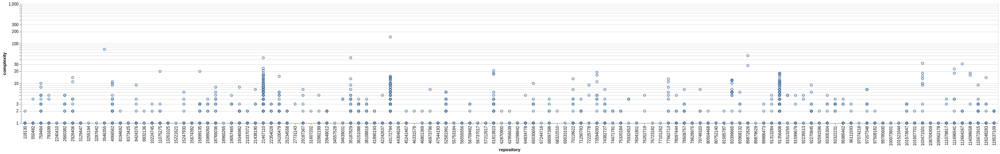

In [68]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(cyc_df).mark_point().encode(
    x = alt.X('repository', type='nominal'),
    y = alt.Y('complexity', scale=alt.Scale(type="log"), title="complexity")
)
chart

In [69]:
cyc_dfmerged = cyc_df.merge(import_sets_df_simp, left_on='repository', right_on='repo')

In [70]:
cyc_dfmerged

,repository,path,type,rank,endline,complexity,name,col_offset,lineno,classname,error,repo,isML
0,100073601,revtok/subwords.py,method,A,142.0,1.0,__init__,4.0,140.0,SubwordTokenizer,NaN,100073601,False
1,100073601,revtok/tokenizer.py,function,A,61.0,1.0,detokenize,0.0,58.0,NaN,NaN,100073601,False
2,101573647,docs/md_autogen.py,method,A,104.0,1.0,__init__,4.0,93.0,MarkdownAPIGenerator,NaN,101573647,True
3,101573647,docs/update_docs.py,function,A,43.0,1.0,copy_templates,0.0,41.0,NaN,NaN,101573647,True
4,101573647,keras_text/data.py,method,A,110.0,1.0,labels,4.0,108.0,Dataset,NaN,101573647,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2173,97207348,baselines/bilstm/runner.py,function,A,27.0,2.0,shuffle,0.0,18.0,NaN,NaN,97207348,True
2174,97207348,tests/test_bahdanauAttentionLayer.py,method,A,35.0,1.0,test_get_output_for,4.0,11.0,TestBahdanauAttentionLayer,NaN,97207348,True
2175,97207348,tests/test_create_dictionary.py,method,A,27.0,1.0,test_create_dictionary,4.0,7.0,TestCreate_dictionary,NaN,97207348,True
2176,97207348,tests/test_IOBChunker.py,method,A,16.0,1.0,test_chunk,4.0,7.0,TestIOBChunker,NaN,97207348,True


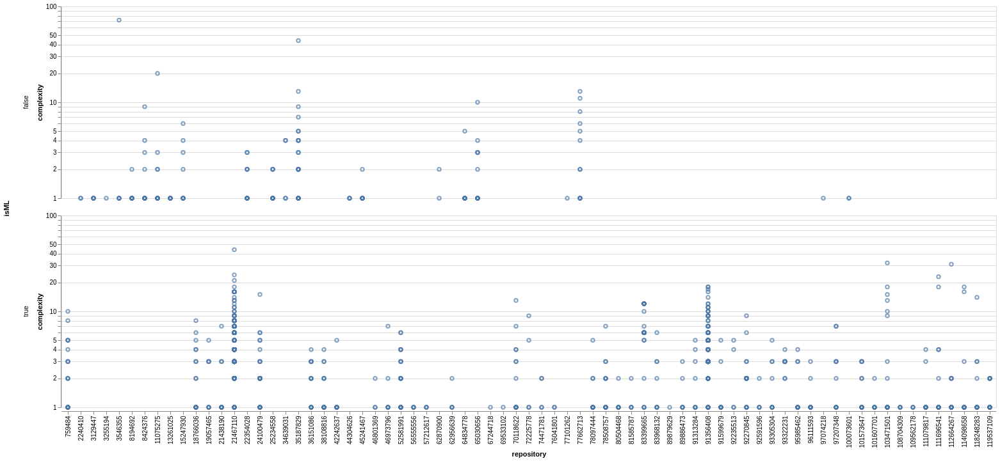

In [72]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(cyc_dfmerged).mark_point().encode(
    x = alt.X('repository', type='nominal'),
    y = alt.Y('complexity', scale=alt.Scale(type="log"), title="complexity"),
    row = 'isML'
)
chart

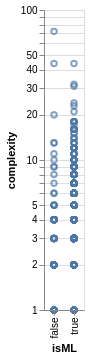

In [74]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(cyc_dfmerged).mark_point().encode(
    y = alt.Y('complexity', scale=alt.Scale(type="log"), title="complexity"),
    x = 'isML'
)
chart

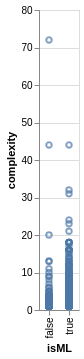

In [155]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(cyc_dfmerged).mark_point().encode(
    y = alt.Y('complexity', title="complexity"),
    x = 'isML'
)
chart

In [142]:
lint_df2merged

,repository,symbol,cnt,repo,isML
0,2240410,anomalous-backslash-in-string,11,2240410,False
1,2240410,attribute-defined-outside-init,4,2240410,False
2,2240410,bad-continuation,1,2240410,False
3,2240410,bad-indentation,1,2240410,False
4,2240410,bad-whitespace,1,2240410,False
...,...,...,...,...,...
2530,119537109,unused-wildcard-import,30,119537109,True
2531,119537109,useless-object-inheritance,21,119537109,True
2532,119537109,useless-return,8,119537109,True
2533,119537109,wildcard-import,11,119537109,True


In [ ]:
lint_df2merged

In [80]:
# All Merged: cyc_df, lint_df2, import_sets_df_simp["isML"]
# TODO: Merge per path/module rather than per repo 

In [81]:
#all_df = import_sets_df_simp.merge(lint_df2, left_on="repo", right_on="repository").merge(cyc_df, left_on="repo", right_on="repository")

In [78]:
#all_df

,repo,isML,repository_x,symbol,cnt,repository_y,path,type,rank,endline,complexity,name,col_offset,lineno,classname,error
0,2240410,False,2240410,anomalous-backslash-in-string,11,2240410,stringparser.py,class,A,36.0,1.0,Dummy,0.0,33.0,NaN,NaN
1,2240410,False,2240410,anomalous-backslash-in-string,11,2240410,tests/stringparser_test.py,method,A,288.0,1.0,test_multiline,4.0,285.0,ParserTest,NaN
2,2240410,False,2240410,attribute-defined-outside-init,4,2240410,stringparser.py,class,A,36.0,1.0,Dummy,0.0,33.0,NaN,NaN
3,2240410,False,2240410,attribute-defined-outside-init,4,2240410,tests/stringparser_test.py,method,A,288.0,1.0,test_multiline,4.0,285.0,ParserTest,NaN
4,2240410,False,2240410,bad-continuation,1,2240410,stringparser.py,class,A,36.0,1.0,Dummy,0.0,33.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133830,119537109,True,119537109,wrong-import-order,3,119537109,utils/metrics/UniqueGram.py,method,A,82.0,1.0,get_ng_fast,4.0,78.0,UniqueGram,NaN
133831,119537109,True,119537109,wrong-import-order,3,119537109,utils/oracle/OracleCfg.py,method,A,83.0,1.0,generate_oracle,4.0,81.0,OracleCfg,NaN
133832,119537109,True,119537109,wrong-import-order,3,119537109,utils/oracle/OracleGru.py,method,A,194.0,1.0,create_output_unit,4.0,184.0,OracleGru,NaN
133833,119537109,True,119537109,wrong-import-order,3,119537109,utils/oracle/OracleLstm.py,method,A,207.0,1.0,create_output_unit,4.0,197.0,OracleLstm,NaN


In [88]:
cyc_df.groupby("repository").median()

,endline,complexity,col_offset,lineno
repository,,,,
118130,80.0,1.0,4.0,76.0
550482,116.5,1.0,4.0,113.5
759484,115.5,1.0,4.0,98.5
791699,28.5,1.0,4.0,22.0
2240410,162.0,1.0,2.0,159.0
...,...,...,...,...
112664267,154.0,1.0,4.0,150.0
114098658,43.0,1.0,4.0,33.5
115672915,119.0,1.0,4.0,103.0


In [89]:
cyc_df.groupby("repository").describe()

endline                                                       \
             count        mean          std   min    25%    50%     75%   
repository                                                                
118130        17.0   86.470588    51.751954  14.0  50.00   80.0  108.00   
550482         8.0  191.625000   276.044478  36.0  44.50  116.5  145.25   
759484        48.0  448.041667  1272.301415   7.0  51.50  115.5  290.50   
791699        10.0   90.500000   131.468839   4.0  14.75   28.5   98.50   
2240410        2.0  162.000000   178.190909  36.0  99.00  162.0  225.00   
...            ...         ...          ...   ...    ...    ...     ...   
112664267     35.0  185.428571   144.632859  15.0  64.00  154.0  285.50   
114098658     32.0   68.125000    77.638845   9.0  32.75   43.0   67.00   
115672915     57.0  163.385965   133.711010  11.0  62.00  119.0  197.00   
118248283     16.0   96.937500    42.805714  16.0  64.75   94.0  132.25   
119537109     51.0  149.039216   121.083766   6.0  63.00   92.0  212.00   

                   complexity            ... col_offset      lineno  \
               max      count      mean  ...        75%  max  count   
repository                               ...                          
118130       211.0       17.0  1.058824  ...        4.0  4.0   17.0   
550482       863.0        8.0  1.375000  ...        4.0  4.0    8.0   
759484      7973.0       48.0  1.833333  ...        4.0  8.0   48.0   
791699       407.0       10.0  1.700000  ...        4.0  4.0   10.0   
2240410      288.0        2.0  1.000000  ...        3.0  4.0    2.0   
...            ...        ...       ...  ...        ...  ...    ...   
112664267    557.0       35.0  1.942857  ...        4.0  4.0   35.0   
114098658    428.0       32.0  2.062500  ...        4.0  5.0   32.0   
115672915    528.0       57.0  1.491228  ...        4.0  4.0   57.0   
118248283    160.0       16.0  2.125000  ...        4.0  4.0   16.0   
119537109    618.0       51.0  1.098039  ...        4.0  4.0   51.0   

                                                                         
                  mean          std   min    25%    50%     75%     max  
repository                                                               
118130       81.882353    50.677759  12.0  47.00   76.0  106.00   207.0  
550482      184.250000   271.453627  25.0  37.75  113.5  143.00   843.0  
759484      440.062500  1273.010444   6.0  34.00   98.5  277.50  7972.0  
791699       85.500000   132.940463   2.0   5.25   22.0   97.50   405.0  
2240410     159.000000   178.190909  33.0  96.00  159.0  222.00   285.0  
...                ...          ...   ...    ...    ...     ...     ...  
112664267   175.200000   146.174915  12.0  45.00  150.0  268.00   556.0  
114098658    57.875000    78.374103   7.0  27.75   33.5   51.25   423.0  
115672915   149.017544   132.784397   6.0  42.00  103.0  195.00   507.0  
118248283    86.750000    45.981880   8.0  49.50   89.5  128.00   147.0  
119537109   143.529412   120.714929   5.0  55.50   91.0  211.00   605.0  

[136 rows x 32 columns]

In [98]:
cyc_df_describe = cyc_df.groupby("repository")["complexity"].describe()
cyc_df_describe

,count,mean,std,min,25%,50%,75%,max
repository,,,,,,,,
118130,17.0,1.058824,0.242536,1.0,1.0,1.0,1.00,2.0
550482,8.0,1.375000,1.060660,1.0,1.0,1.0,1.00,4.0
759484,48.0,1.833333,1.894374,1.0,1.0,1.0,1.25,10.0
791699,10.0,1.700000,1.494434,1.0,1.0,1.0,1.00,5.0
2240410,2.0,1.000000,0.000000,1.0,1.0,1.0,1.00,1.0
...,...,...,...,...,...,...,...,...
112664267,35.0,1.942857,5.063961,1.0,1.0,1.0,1.00,31.0
114098658,32.0,2.062500,3.942633,1.0,1.0,1.0,1.00,18.0
115672915,57.0,1.491228,1.241008,1.0,1.0,1.0,1.00,9.0


In [127]:
cyc_df_describe_flat = pd.DataFrame(cyc_df_describe[["count", "mean", "max"]].to_records())
cyc_df_describe_flat

,repository,count,mean,max
0,118130,17.0,1.058824,2.0
1,550482,8.0,1.375000,4.0
2,759484,48.0,1.833333,10.0
3,791699,10.0,1.700000,5.0
4,2240410,2.0,1.000000,1.0
...,...,...,...,...
131,112664267,35.0,1.942857,31.0
132,114098658,32.0,2.062500,18.0
133,115672915,57.0,1.491228,9.0
134,118248283,16.0,2.125000,14.0


In [100]:
# wrangle so that it can be merged into datafame (let 'cnt' field be arbitrary metric)

In [ ]:
# https://stackoverflow.com/questions/14507794/pandas-how-to-flatten-a-hierarchical-index-in-columns
# lint_df = pd.DataFrame(lint_df.to_records())

In [129]:
cyc_mean_df = pd.DataFrame({"repository": cyc_df_describe_flat["repository"], "symbol": "cyc_mean", "cnt": cyc_df_describe_flat["mean"]})
cyc_mean_df

,repository,symbol,cnt
0,118130,cyc_mean,1.058824
1,550482,cyc_mean,1.375000
2,759484,cyc_mean,1.833333
3,791699,cyc_mean,1.700000
4,2240410,cyc_mean,1.000000
...,...,...,...
131,112664267,cyc_mean,1.942857
132,114098658,cyc_mean,2.062500
133,115672915,cyc_mean,1.491228
134,118248283,cyc_mean,2.125000


In [132]:
cyc_max_df = pd.DataFrame({"repository": cyc_df_describe_flat["repository"], "symbol": "cyc_max", "cnt": cyc_df_describe_flat["max"]})
cyc_max_df

,repository,symbol,cnt
0,118130,cyc_max,2.0
1,550482,cyc_max,4.0
2,759484,cyc_max,10.0
3,791699,cyc_max,5.0
4,2240410,cyc_max,1.0
...,...,...,...
131,112664267,cyc_max,31.0
132,114098658,cyc_max,18.0
133,115672915,cyc_max,9.0
134,118248283,cyc_max,14.0


In [82]:
lint_df2

,repository,symbol,cnt
0,118130,assignment-from-no-return,2
1,118130,attribute-defined-outside-init,13
2,118130,bad-continuation,6
3,118130,bad-indentation,5
4,118130,bad-whitespace,162
...,...,...,...
4449,119537109,unused-wildcard-import,30
4450,119537109,useless-object-inheritance,21
4451,119537109,useless-return,8
4452,119537109,wildcard-import,11


In [136]:
lint_df2_extended = pd.concat([lint_df2, cyc_max_df, cyc_mean_df], ignore_index=True)
lint_df2_extended

,repository,symbol,cnt
0,118130,assignment-from-no-return,2.000000
1,118130,attribute-defined-outside-init,13.000000
2,118130,bad-continuation,6.000000
3,118130,bad-indentation,5.000000
4,118130,bad-whitespace,162.000000
...,...,...,...
4721,112664267,cyc_mean,1.942857
4722,114098658,cyc_mean,2.062500
4723,115672915,cyc_mean,1.491228
4724,118248283,cyc_mean,2.125000


In [137]:
lint_df2_extended_merged = lint_df2_extended.merge(import_sets_df_simp, left_on='repository', right_on='repo')

In [138]:
lint_df2_extended_merged

,repository,symbol,cnt,repo,isML
0,2240410,anomalous-backslash-in-string,11.000000,2240410,False
1,2240410,attribute-defined-outside-init,4.000000,2240410,False
2,2240410,bad-continuation,1.000000,2240410,False
3,2240410,bad-indentation,1.000000,2240410,False
4,2240410,bad-whitespace,1.000000,2240410,False
...,...,...,...,...,...
2676,119537109,wrong-import-order,3.000000,119537109,True
2677,119537109,cyc_max,2.000000,119537109,True
2678,119537109,cyc_mean,1.098039,119537109,True
2679,759484,cyc_max,10.000000,759484,True


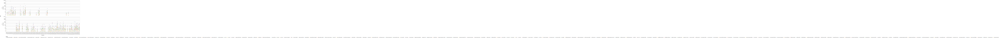

In [139]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(lint_df2_extended_merged).mark_point().encode(
    x = alt.X('repository', type='nominal'),
    y = alt.Y('cnt', scale=alt.Scale(type="log"), title="Issue count"),
    color = alt.Color('symbol', legend=alt.Legend(title="symbol", orient="bottom")),
    row = 'isML'
)
chart

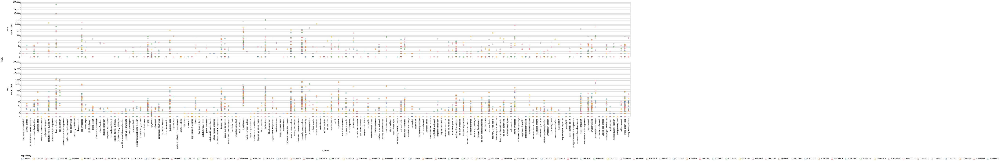

In [140]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(lint_df2_extended_merged).mark_point().encode(
    x = alt.X('symbol', type='ordinal'),
    y = alt.Y('cnt', scale=alt.Scale(type="log"), title="Issue count"),
    color = alt.Color('repository', type='nominal', legend=alt.Legend(title="repository", orient="bottom")),
    row = 'isML'
)
chart

In [131]:
raw_df = pd.read_csv("radon-raw-python3-output.csv",
                     low_memory=False
)


In [132]:
raw_df

,repository,path,loc,lloc,sloc,comments,multi,blank,single_comments,error
0,100073601,setup.py,86.0,8.0,67.0,34.0,0.0,18.0,1.0,NaN
1,100073601,revtok/__init__.py,2.0,2.0,2.0,0.0,0.0,0.0,0.0,NaN
2,100073601,revtok/subwords.py,157.0,132.0,129.0,20.0,0.0,10.0,18.0,NaN
3,100073601,revtok/tokenizer.py,61.0,56.0,50.0,1.0,0.0,10.0,1.0,NaN
4,100073601,test/__init__.py,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...
4719,99785600,code/generator.py,150.0,103.0,102.0,63.0,0.0,20.0,28.0,NaN
4720,99785600,code/main.py,305.0,186.0,189.0,112.0,0.0,31.0,85.0,NaN
4721,99785600,code/utils.py,115.0,81.0,78.0,6.0,25.0,6.0,6.0,NaN
4722,99785600,data/arXiv/abstract_extract.py,49.0,20.0,19.0,2.0,21.0,7.0,2.0,NaN


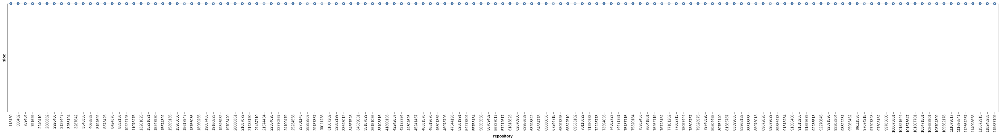

In [142]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(raw_df).mark_point().encode(
    x = alt.X('repository', type='nominal'),
    y = alt.Y('sloc', scale=alt.Scale(type="log"), title="sloc")
)
chart

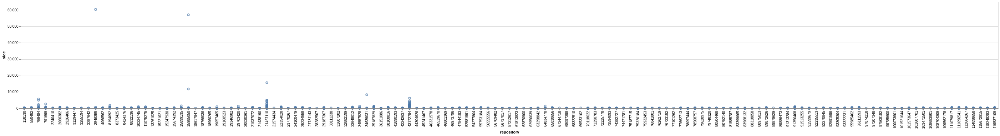

In [143]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(raw_df).mark_point().encode(
    x = alt.X('repository', type='nominal'),
    #y = alt.Y('sloc', scale=alt.Scale(type="log"), title="sloc")
    y = alt.Y('sloc', title="sloc")
)
chart

In [139]:
raw_df_merged = raw_df.merge(import_sets_df_simp, left_on='repository', right_on='repo')

In [140]:
raw_df_merged

,repository,path,loc,lloc,sloc,comments,multi,blank,single_comments,error,repo,isML
0,100073601,setup.py,86.0,8.0,67.0,34.0,0.0,18.0,1.0,NaN,100073601,False
1,100073601,revtok/__init__.py,2.0,2.0,2.0,0.0,0.0,0.0,0.0,NaN,100073601,False
2,100073601,revtok/subwords.py,157.0,132.0,129.0,20.0,0.0,10.0,18.0,NaN,100073601,False
3,100073601,revtok/tokenizer.py,61.0,56.0,50.0,1.0,0.0,10.0,1.0,NaN,100073601,False
4,100073601,test/__init__.py,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,100073601,False
...,...,...,...,...,...,...,...,...,...,...,...,...
2855,97207348,baselines/bilstm/runner.py,123.0,89.0,87.0,5.0,5.0,27.0,4.0,NaN,97207348,True
2856,97207348,tests/test_bahdanauAttentionLayer.py,35.0,25.0,25.0,0.0,0.0,10.0,0.0,NaN,97207348,True
2857,97207348,tests/test_create_dictionary.py,27.0,21.0,21.0,0.0,0.0,6.0,0.0,NaN,97207348,True
2858,97207348,tests/test_IOBChunker.py,16.0,13.0,12.0,0.0,0.0,4.0,0.0,NaN,97207348,True


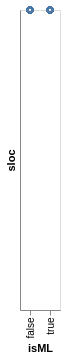

In [144]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(raw_df_merged).mark_point().encode(
    y = alt.Y('sloc', scale=alt.Scale(type="log"), title="sloc"),
    x = 'isML'
)
chart

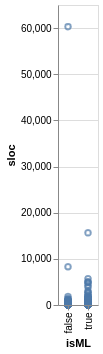

In [146]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(raw_df_merged).mark_point().encode(
    y = alt.Y('sloc', title="sloc"),
    x = 'isML'
)
chart

In [159]:
raw_df_merged_with_cyc = raw_df_merged.merge(cyc_df, left_on=['repository', 'path'], right_on=['repository', 'path'])

In [160]:
raw_df_merged_with_cyc

,repository,path,loc,lloc,sloc,comments,multi,blank,single_comments,error_x,...,isML,type,rank,endline,complexity,name,col_offset,lineno,classname,error_y
0,100073601,revtok/subwords.py,157.0,132.0,129.0,20.0,0.0,10.0,18.0,NaN,...,False,method,A,142.0,1.0,__init__,4.0,140.0,SubwordTokenizer,NaN
1,100073601,revtok/tokenizer.py,61.0,56.0,50.0,1.0,0.0,10.0,1.0,NaN,...,False,function,A,61.0,1.0,detokenize,0.0,58.0,NaN,NaN
2,101573647,docs/md_autogen.py,392.0,228.0,253.0,19.0,49.0,71.0,19.0,NaN,...,True,method,A,104.0,1.0,__init__,4.0,93.0,MarkdownAPIGenerator,NaN
3,101573647,docs/update_docs.py,49.0,27.0,37.0,0.0,0.0,12.0,0.0,NaN,...,True,function,A,43.0,1.0,copy_templates,0.0,41.0,NaN,NaN
4,101573647,keras_text/data.py,117.0,65.0,60.0,0.0,31.0,26.0,0.0,NaN,...,True,method,A,110.0,1.0,labels,4.0,108.0,Dataset,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2173,97207348,baselines/bilstm/runner.py,123.0,89.0,87.0,5.0,5.0,27.0,4.0,NaN,...,True,function,A,27.0,2.0,shuffle,0.0,18.0,NaN,NaN
2174,97207348,tests/test_bahdanauAttentionLayer.py,35.0,25.0,25.0,0.0,0.0,10.0,0.0,NaN,...,True,method,A,35.0,1.0,test_get_output_for,4.0,11.0,TestBahdanauAttentionLayer,NaN
2175,97207348,tests/test_create_dictionary.py,27.0,21.0,21.0,0.0,0.0,6.0,0.0,NaN,...,True,method,A,27.0,1.0,test_create_dictionary,4.0,7.0,TestCreate_dictionary,NaN
2176,97207348,tests/test_IOBChunker.py,16.0,13.0,12.0,0.0,0.0,4.0,0.0,NaN,...,True,method,A,16.0,1.0,test_chunk,4.0,7.0,TestIOBChunker,NaN


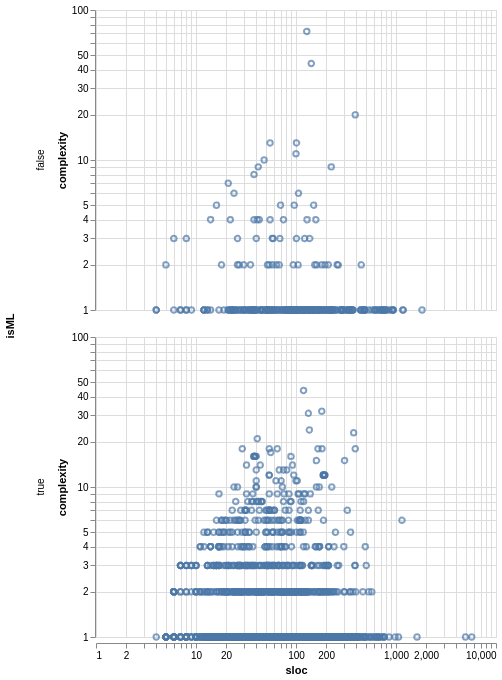

In [169]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(raw_df_merged_with_cyc).mark_point().encode(
    x = alt.X('sloc', title="sloc", scale=alt.Scale(type="log")),
    y = alt.Y('complexity', title="complexity", scale=alt.Scale(type="log")),
    row = 'isML'
)
chart

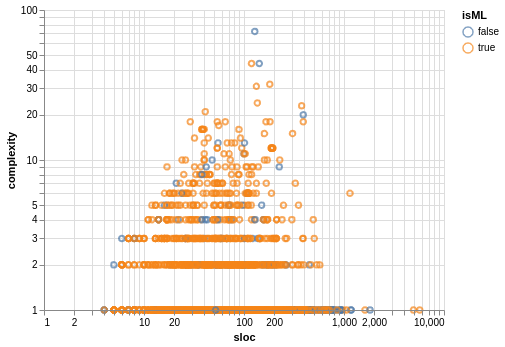

In [168]:
# following https://vega.github.io/vega-lite/examples/circle_natural_disasters.html
chart = alt.Chart(raw_df_merged_with_cyc).mark_point().encode(
    x = alt.X('sloc', title="sloc", scale=alt.Scale(type="log")),
    y = alt.Y('complexity', title="complexity", scale=alt.Scale(type="log")),
    color = 'isML'
)
chart